# Fundamental Data Structures and Algorithms 05 - Trees - Exercise
---


The following problems should help you get familiar with trees.

### Question 1  

Using pen and paper, draw the resulting Binary Search Tree based on the  following instructions:

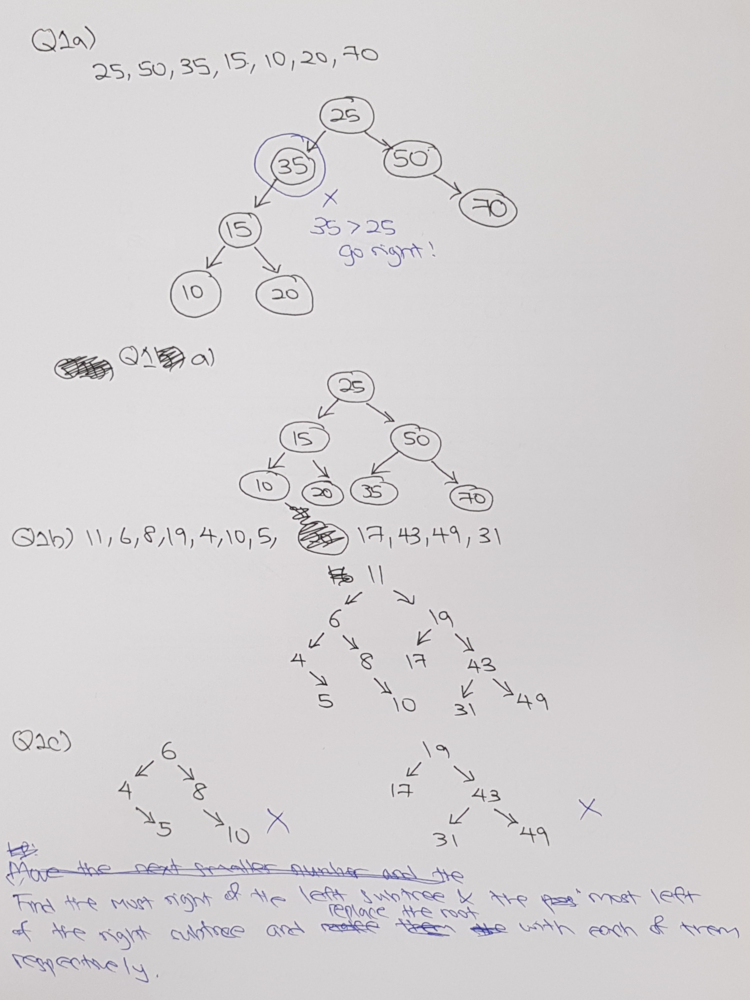

**(a)** Insert the numbers `25, 50, 35, 15, 10, 20, 70` in sequence.

Double click <b>here</b> for the solution
<!--
       25
     /    \
   15      50
  /  \    /  \
 10  20  35   70
 -->

**(b)** Insert the numbers `11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31` in sequence.

Double click <b>here</b> for the solution
<!--
     11
   /    \
  6      19
 / \    /  \
4   8  17  43
 \   \    /  \
  5  10  31  49
-->

**(c)** Draw the 2 possible trees that can formed after the removal of `11` from the tree in **(b)**.

Double click <b>here</b> for the solution
<!--
     10                        17 
   /    \                    /    \
  6      19                 6      19
 / \    /  \               / \       \
4   8  17  43             4   8      43
 \        /  \             \   \    /  \
  5      31  49             5  10  31  49
  -->

---

### Question 2

**(a)** For each tree, determine the following:
- Root node
- Leaf node(s)

Double click <b>here</b> for the solution
<!--
Tree 1
    Root node    : 100
    Leaf node(s) : 10, 30, 150, 300

Tree 2
    Root node    : 18
    Leaf node(s) : 9, 1, 2, 3
-->

**(b)** Given the trees above, write down the nodes visited during pre-order, in-order and post-order traversal. Click on the 3 dots below to reveal the answer.

Double click <b>here</b> for the solution
<!--
(a)
    pre-order  : 100, 20, 10, 30, 200, 150, 300
    in-order   : 10, 20, 30, 100, 150, 200, 300
    post-order : 10, 30, 20, 150, 300, 200, 100

(b)
    pre-order  : 8, 5, 9, 7, 1, 12, 2, 4, 11, 3
    in-order   : 9, 5, 1, 7, 2, 12, 8, 4, 3, 11
    post-order : 9, 1, 2, 12, 7, 5, 3, 11, 4, 8
-->

---

### (DONE) Question 3

Expanding from the Binary Search Tree class implementation in Chapter 3.6.2.1 and the algorithms detailed in Chapter 3.6.2.3 of the Trees lecture notes, implement the following methods:

**(a)** `search` that takes in a value to be searched as input, and returns `True` if the value is found, and

**(b)** `minSearch` and `maxSearch` that returns the the minimum and maximum values contained within the tree espectively.

You are highly encouraged to create your own test cases to test your code.

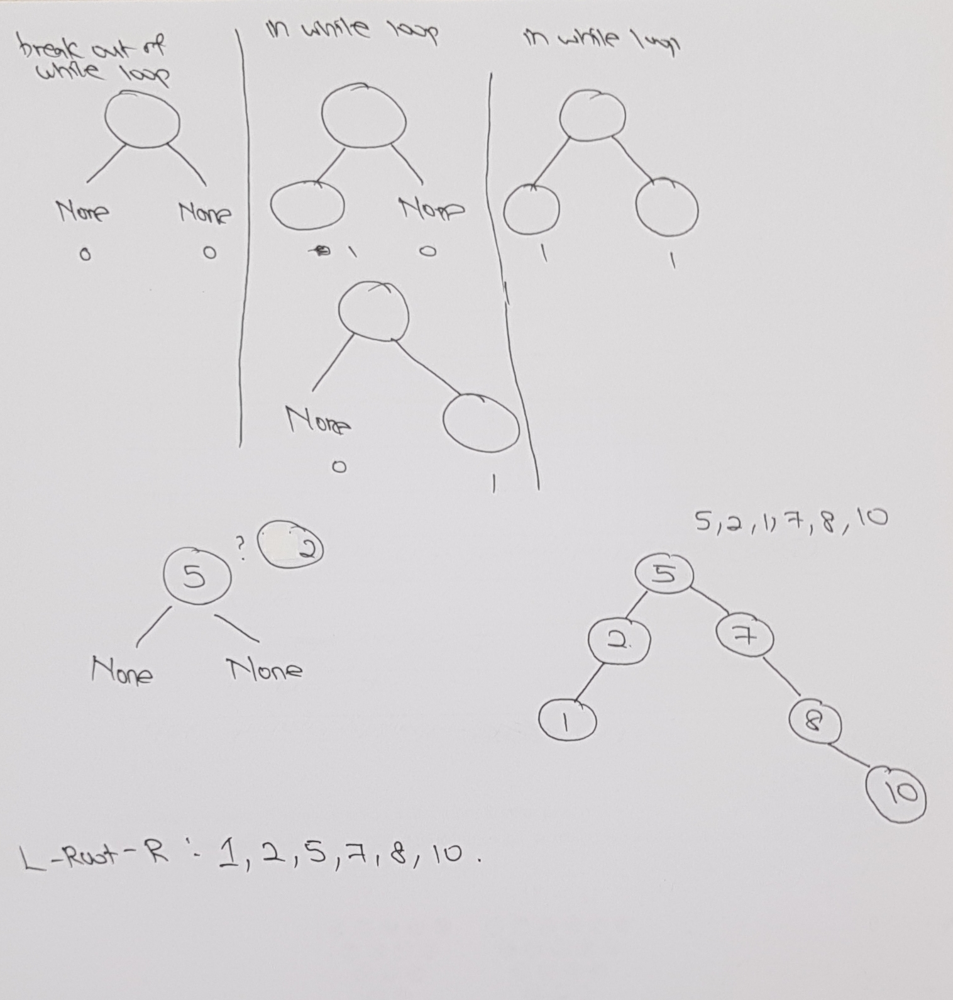



In [1]:
class BST:
    
    class Node:    
        def __init__(self, data):
            self.data = data
            self.left = None
            self.right = None
            
    def __init__(self):
        self.root = None # This is a Node
        self.size = 0
        self.width = 0
        self.depth = 0
    
    def insert(self, data):
        node = BST.Node(data)
        
        if self.root is None:
            self.root = node
            self.size += 1
            return
        else:
            currentnode = self.root
            while currentnode.left is not None or currentnode.right is not None:
                if currentnode.data < node.data:
                    if currentnode.right is None:
                        currentnode.right = node
                        self.size += 1
                        return
                    else:
                        currentnode = currentnode.right
                        continue
                elif currentnode.data > node.data:
                    if currentnode.left is None:
                        currentnode.left = node
                        self.size += 1
                        return
                    else:
                        currentnode = currentnode.left
                        continue
            if currentnode.data < node.data:
                currentnode.right = node
                self.size += 1
                return
            elif currentnode.data > node.data:
                currentnode.left = node
                self.size += 1
                return
            else:
                return
    
    def recInsert(self, root, data): # Do not have while loops inside recursive functions!
        
        aNode = BST.Node(data)
        
        if self.root is None:
            self.root = aNode
            self.size += 1
            return None
        
        node = root
        
        if node:
            if node.data == aNode.data:
                return None
            elif node.data > aNode.data:
                if node.left is not None:
                    return self.recInsert(node.left, data)
                else:
                    node.left = aNode
                    self.size += 1
                    return
            else:
                if node.right is not None:
                    return self.recInsert(node.right, data)
                else:
                    node.right = aNode
                    self.size += 1
                    return
        return
            
    def inOrder(self, root):
        node = root
        if node is not None:
            self.inOrder(node.left)
            print(node.data, end = ' ')
            self.inOrder(node.right)
            
    def preOrder(self, root):
        node = root
        if node is not None:
            print(node.data)
            self.inOrder(node.left)
            self.inOrder(node.right)

    def postOrder(self, root):
        node = root
        if node is not None:
            self.inOrder(node.left)
            self.inOrder(node.right)
            print(node.data)
            
    def remove(self, key):
        # Swap the data NOT the node because node has connections but data does not!
        
        removing, parent = self.find(key) # Returns the node to be removed and its parent, if self.root is to be removed, 
        # returns parent = self.root.
        
        if removing is None: # If node intended to be remove does not exist, do nothing.
            return
        # Recurse until either is leaf node or either left or right node is None. >>> THIS IS WRONG <<<
        # THE RECURSION IS ALREADY DONE IN SELF.FIND(KEY)!!!
        else: #while removing is not None: <<< OLD CODE IS WRONG!!!
            if removing.left is not None and removing.right is not None: # Both children exist
                leftMax, leftparent = self.maxSearch(removing.left)
                rightMin, rightparent = self.minSearch(removing.right)
                removing.data = leftMax.data
                if removing.left.right is None:
                    removing.left = removing.left.left
                    return
                else:
                    leftparent.right = leftMax.left
                ### If using rightMin to replace
#                 removing.data = rightMin.data
#                 if removing.right.left is None:
#                     removing.right = removing.right.right
#                     return
#                 else:
#                     rightparent.left = rightMin.right
                return
            elif removing.right is not None and removing.left is None: # Right exists but not left
                rightMin, rightparent = self.minSearch(removing.right)
                removing.data = rightMin.data
                if rightparent is None:
                    removing.right = removing.right.right
                else:
                    rightparent.left = rightMin.right
                return
            elif removing.left is not None and removing.right is None: # Left exists but not right
                leftMax, leftparent = self.maxSearch(removing.left)
                removing.data = leftMax.data
                if leftparent is None:
                    removing.left = removing.left.left
                else:
                    leftparent.right = leftMax.left
                return
            else: # removing is a leaf node, just set removing = None if want to remove a left node
                removing = None
            
            
    def search(self, data): # Search returns True or False if node exists or otherwise, respectively.
        currentnode = self.root
        while currentnode.left is not None or currentnode.right is not None:
            if currentnode.data == data:
                return True
            elif currentnode.data < data:
                if currentnode.right is None:
                    return False
                else:
                    currentnode = currentnode.right
                    continue
            else:
                if currentnode.left is None:
                    return False
                else:
                    currentnode=currentnode.left
                    continue
        return currentnode.data == data
    
    def find(self, data): # Input: data of the node. find() returns that node and its parent, if found.
        currentnode = self.root
        parent = self.root
        while currentnode.left is not None or currentnode.right is not None:
            if currentnode.data == data:
                return currentnode, parent
            elif currentnode.data < data:
                if currentnode.right is None:
                    return
                else:
                    parent = currentnode
                    currentnode = currentnode.right
                    continue
            else:
                if currentnode.left is None:
                    return
                else:
                    parent = currentnode
                    currentnode=currentnode.left
                    continue
        return currentnode, parent
                        
        # write your code here
        
    def minSearch(self, currentnode): # INPUT NODE AS THE ROOT NODE OF TREE/SUBTREE -> Node with smallest value.
        # Do not return currentnode.data, parent of different data types, return same data type.
        # SHOULD NOT SET THE PARENT AS SELF.ROOT because if the while loop doesn't execute i.e.
        # currentnode.left is None, parent will be return as the root of the entire tree!
        
        parent = None
        while currentnode.left is not None:
            parent = currentnode
            currentnode = currentnode.left
        return currentnode, parent
    
    def maxSearch(self, currentnode): 
        # Do not return currentnode.data, parent of different data types, return same data type.
        # SHOULD NOT SET THE PARENT AS SELF.ROOT because if the while loop doesn't execute i.e.
        # currentnode.left is None, parent will be return as the root of the entire tree!

        parent = None
        while currentnode.right is not None:
            parent = currentnode
            currentnode = currentnode.right
        return currentnode, parent

In [ ]:
# Testing with 11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31, for remove()

tree3 = BST()

for i in [11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31]:
    tree3.insert(i)
    
print(tree3.find(5)[1].data,tree3.find(5)[0].data) # Parent = 6, Found node = 8
print(tree3.minSearch(tree3.root)[0].data, tree3.minSearch(tree3.root)[1].data) # 4 is the minNode, 6 is the parent
print(tree3.maxSearch(tree3.root)[0].data, tree3.maxSearch(tree3.root)[1].data) # 49 is the maxNode, 43 is the parent
node10 = tree3.find(10)[0]
print(tree3.minSearch(node10)[0].data, tree3.minSearch(node10)[1]) # 4 is the minNode, 6 is the parent
print(tree3.search(8)) # True
tree3.remove(8) 
print(tree3.search(8)) # False
tree3.inOrder(tree3.root) # Print ascending order.

In [ ]:
# Testing with 11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31, for remove()

tree4 = BST()

for i in [11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31]:
    tree4.insert(i)
    
for i in [19,43,6,11]:
    print("-"*30)
    print("The root of the tree is: ", tree4.root.data)
    print("To be removed is: ", i)
    tree4.inOrder(tree4.root)
    print()
    print(f"Search {i}: ", tree4.search(i))
    print(f"Found {i}, Parent: {tree4.find(i)[1].data}.")
    print(f"Removed {i}: ", tree4.remove(i))
    print(f"Search {i}: ", tree4.search(i))
    tree4.inOrder(tree4.root)
    print()

In [ ]:
def recInsert(root, data): # Do not have while loops inside recursive functions! This function is independent of the tree.

    aNode = BST.Node(data)

    if root is None:
        root = aNode
        return None

    node = root

    if node:
        if node.data == aNode.data:
            return None
        elif node.data > aNode.data:
            if node.left is not None:
                return recInsert(node.left, data)
            else:
                node.left = aNode
                return
        else:
            if node.right is not None:
                return recInsert(node.right, data)
            else:
                node.right = aNode
                return

In [ ]:
# Testing with 11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31

tree2 = BST()

tree2.insert(11)
tree2.insert(6)
tree2.insert(8)
tree2.insert(19)
tree2.insert(4)
tree2.insert(10)
tree2.insert(5)
tree2.insert(17)
tree2.insert(43)
tree2.insert(49)
tree2.insert(31)


print("-----")
# print(tree2.root.left.data)
# print(tree2.root.right.data)
# print(tree2.root.right.right.data)
print(tree2.size)
print("-----")
print("Inorder Printing...")
tree2.inOrder(tree2.root)
print("-----")
print("Preorder Printing...")
tree2.preOrder(tree2.root)
print("-----")
print("Postorder Printing...")
tree2.postOrder(tree2.root)

tree2.maxSearch()[1].left.data

In [ ]:
# Testing with 5,2,1,7,8,10, Testing insert()

tree = BST()

tree.insert(5)
tree.insert(2)
tree.insert(1)
tree.insert(7)
tree.insert(8)
tree.insert(10)

print("-----")
print(tree.root.left.data)
print(tree.root.right.data)
print(tree.root.right.right.data)
print(tree.size)
print("-----")
print("Inorder Printing...")
tree.inOrder(tree.root)
print("-----")
print("Preorder Printing...")
tree.preOrder(tree.root)
print("-----")
print("Postorder Printing...")
tree.postOrder(tree.root)

In [ ]:
# Testing with 5,2,1,7,8,10, Testing recInsert()

tree = BST()

tree.recInsert(tree.root, 5)
tree.recInsert(tree.root, 2)
tree.recInsert(tree.root, 1)
tree.recInsert(tree.root, 7)
tree.recInsert(tree.root, 8)
tree.recInsert(tree.root, 10)

print("-----")
print(tree.size)
print("-----")
print("Inorder Printing...")
tree.inOrder(tree.root)
print("-----")
print("Preorder Printing...")
tree.preOrder(tree.root)
print("-----")
print("Postorder Printing...")
tree.postOrder(tree.root)
print("-----")
print(tree.root.left.data)

In [ ]:
print(tree.search(1))
print(tree.search(2))
print(tree.search(3))
print(tree.search(5))
print(tree.search(9))
print(tree.search(10))
print(tree.search(11))
print("-----")
print(tree.search(1))
print(tree.search(2))
print(tree.search(3))
print(tree.search(5))
print(tree.search(9))
print(tree.search(10))
print(tree.search(11))

In [ ]:
print(tree.minSearch())
print(tree.maxSearch())

### Check if BST is a valid BST

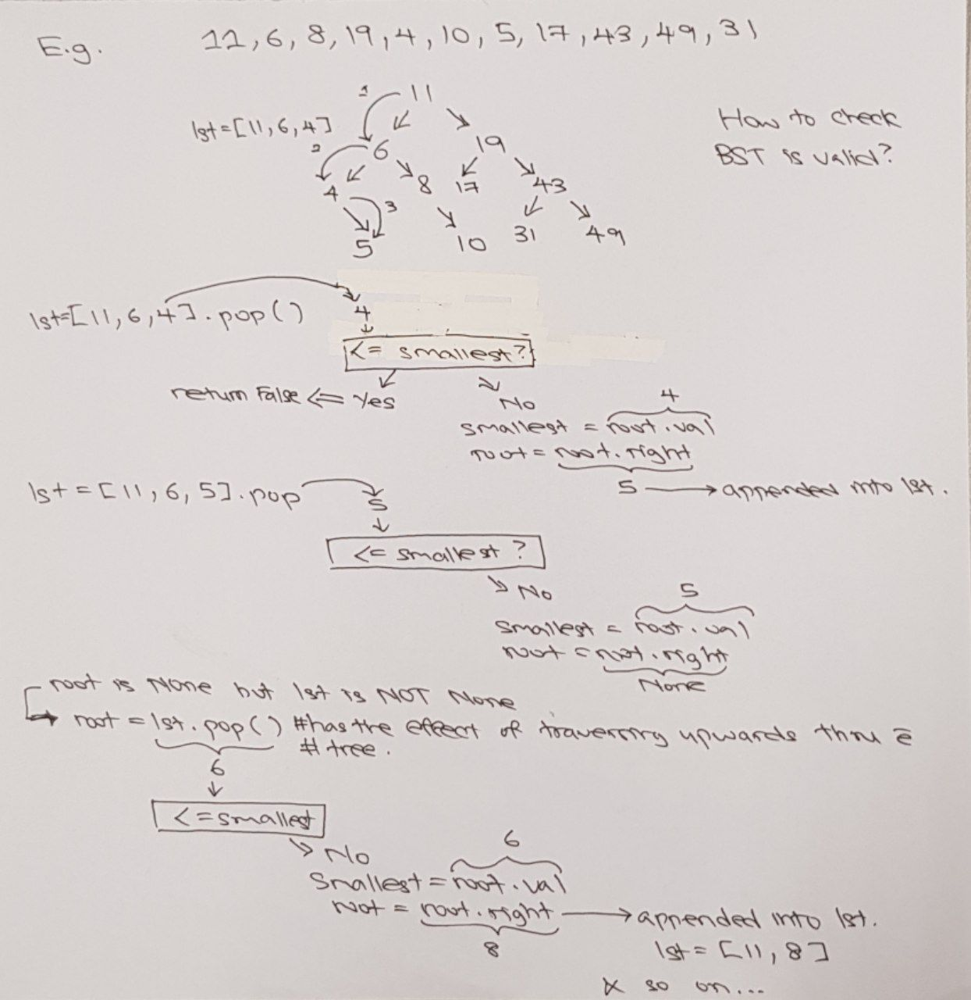

In [ ]:
def isValidBST(root) -> bool: # Strategy is to use inorder traversal, compare the next
    # node with the previous node and if it is smaller => not a BST => returns False
    # , returns True if otherwise.
    
            lst, smallest = [], float('-inf')
            
            while lst or root: # While both the list and the node is not empty
                while root: # While the node is not empty, go all the way left
                    lst.append(root) # Append all the lefts to list
                    root = root.left # Traverse to the left
                    
                root = lst.pop() # Start poping from lst.
                
                if root.val <= smallest: # Compare with the smallest, if it is smaller,
                    # returns False
                    return False
                
                smallest = root.val # Then set the leftmost of the tree to be the smallest
                root = root.right # Go to the right of the leftmost.
            
            # Return true because two cases: 1) the root is None => valid BST
            # and 2) the iteration causes the lst to be empty at the end
            # => no root is smaller than previous root => valid BST.
            return True

In [ ]:
def recoverTree(root: BST.Node()) -> None:
    """
    Do not return anything, modify root in-place instead.
    """
    curr = root
    prev = BST.Node(float('-inf'))
    replace = []
    stack = []

    while curr or stack:
        while curr:
            stack.append(curr) # Get all the levels on the left subtree into the stack
            curr = curr.left

        temp = stack.pop()

        if temp.val < prev.val: # If the order is wrong, append into replace. NODES VALUES ARE
            # COMPARED
            replace.append((prev, temp)) # NODES ARE APPENDED INTO THE REPLACE LIST.

        prev = temp
        curr = temp.right

    replace[0][0].val, replace[-1][1].val = replace[-1][1].val, replace[0][0].val # Since there
    # are only two values that are swapped, means there is only two two-tuples in the
    # replace list, the first tuple will be of the form (bigger, smaller) i.e. wrong order
    # because the order should be (smaller, bigger). The last tuple will also be the wrong order
    # which is (bigger, smaller), therefore, the two wrong values are 
    # replace[0][0].val, replace[-1][1].val

In [12]:
def iterInorder(root): # Use a stack to traverse upwards in a BST.
    # Do inorder traversal using iteration.
    # Should not use 'while' loop inside of the while stack or root line!!!
    
    stack, seq = [], []
    
    while stack or root:
        while root:
            stack.append(root)
            root = root.left
        
        # print("Stack is ", stack)
        root = stack.pop() # Stack will collect all the nodes in the left subtree in increasing
        # level depth. This is the mechanism to traverse upwards through the tree.
        seq.append(root)
        
        root = root.right # Mechanism for traversing to the right. Even if root.right is None,
        # 'while stack or root' ensures that if stack is not None or empty AND root is None,
        # then the stack must contain the higher level element of the left branch of the tree
        # therefore the parser will traverse upwards.
        # If root.right is not None, the parser will travel right and continue down left,
        # repeating the entire sub-tree traversal.
            
    return seq

In [13]:
# Test iterative Inorder traversal.

tree5 = BST()
for i in [11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31]:
    tree5.insert(i)

In [14]:
for node in iterInorder(tree5.root):
    print(node.data)

4
5
6
8
10
11
17
19
31
43
49


In [ ]:
# Zahiri Codes, Implementation without node, just a single BST class.

class BST:
            
    def __init__(self,data):
        self.data =  data
        self.size = 0
        self.width = 0
        self.length = 0
    
    def insert(self, data):
        if self.data:
            if data < self.data:
                if self.left is None:
                    self.left = BST(data)
                else:
                    self.left.insert(data)
            elif data > self.data:
                if self.right is None:
                    self.right = BST(data)
                else:
                    self.right.insert(data)
        else:
            self.data = BST(data)
        return
            
    def inOrder(self):
        if self.left:
            self.left.printTree()
            print(self.data)
        if self.right:
            self.right.printTree()
            
    def search(self, data):
        pass
        # write your code here
    def minSearch(self):
        # write your code here
        pass
    def maxSearch(self):
        # write your code here
        pass

---

### Question 4

Repeat Question 1 but for an AVL tree instead. Also, for each tree, you are highly encouraged to draw the resulting trees after each insertion/rotation/deletion step.

**(a)** Insert the numbers `25, 50, 35, 15, 10, 20, 70` in sequence.   

Double click <b>here</b> for the solution
<!--
       25
     /    \
   15      50
  /  \    /  \
 10  20  35   70
-->

**(b)** Insert the numbers `11, 6, 8, 19, 4, 10, 5, 17, 43, 49, 31` in sequence.

Double click <b>here</b> for the solution
<!--
       8
    /    \
   5      19
 /  \    /   \
4    6  11    43
       / \   /  \
     10  17 31  49
-->

**(c)** Draw the 2 possible trees that can formed after the removal of `11` from the tree in **(b)**.

Double click <b>here</b> for the solution
<!--

       8
    /    \
   5      19
 /  \    /   \
4    6  10    43
         \   /  \
         17 31  49
         
-->

---

### (DONE) Question 5
  
**(DONE) (a)** Using pen and paper, draw the AVL Tree after inserting the numbers `40, 20, 10, 25, 30, 22, 50` in sequence.
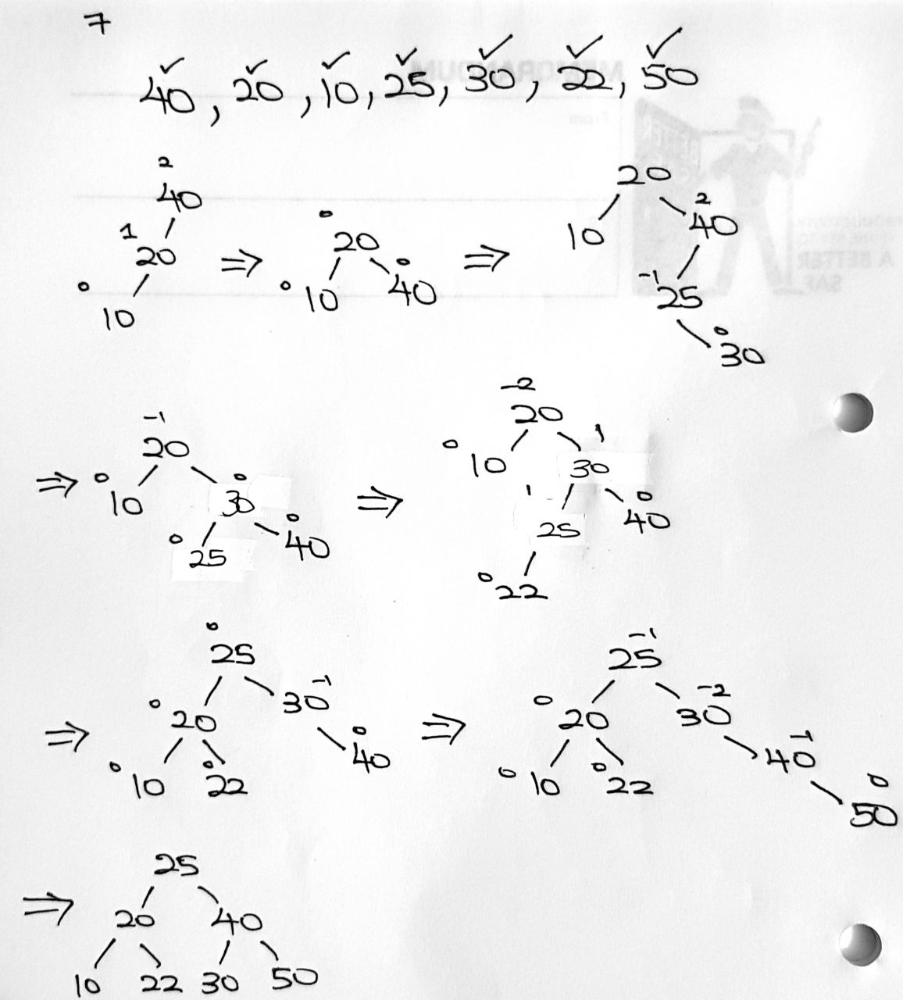


Double click <b>here</b> for the solution
<!--
       25
     /    \
   20      40
  /  \    /  \
 10  22  30   50
-->

**(DONE) (b)** Continuing from part (a), draw the resulting AVL tree after deleting the numbers in the order `22, 25, 40, 20`.

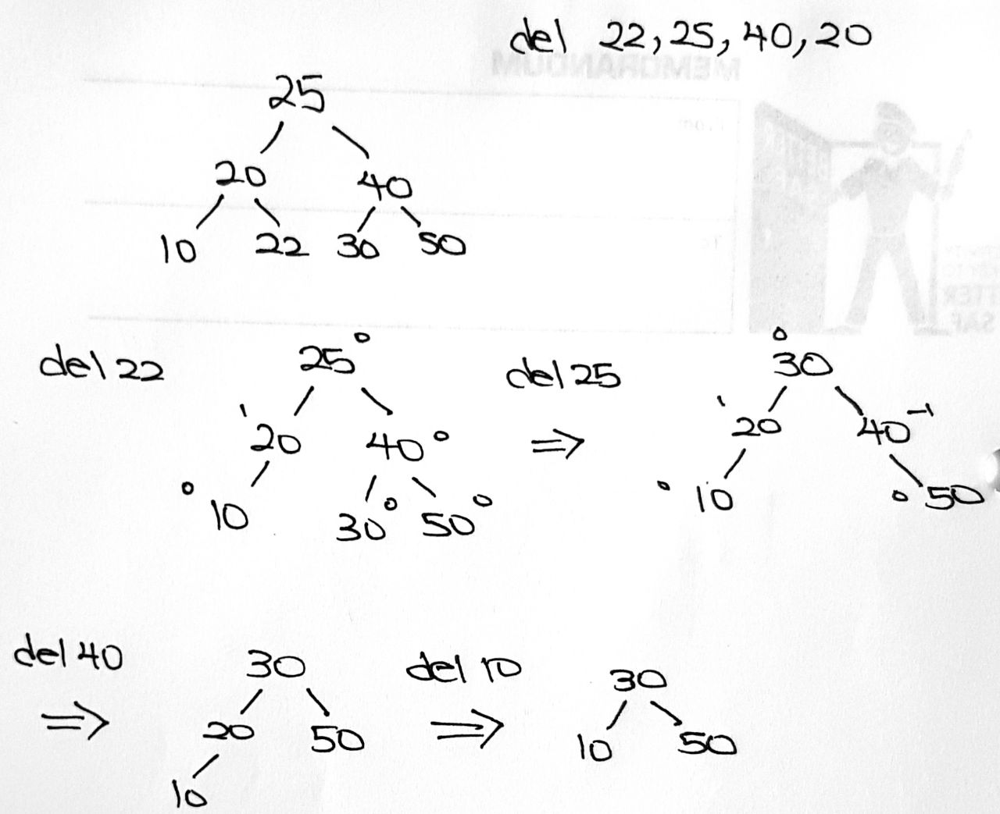

Double click <b>here</b> for the solution
<!--

  30 
 /  \
10  50

-->

---

### (SKIPPED) Question 6

Implement an AVL tree class. You are encouraged to research the algorithm from reliable sources. It should include methods to insert and delete. You should also include the various rotation methods that may be required during insertions and deletions.

In [ ]:
class AVL:
    # write your code here

---

### Question 7

Given the number of times that a coin is thrown, $n$, as input, write a function `coin` that return a list of string for all the possibilities (heads[H] and tails[T]).

*Examples*:

* `coin(1)` should return `["H", "T"]`
* `coin(2)` should return `["HH", "HT","TH","TT"]`
* `coin(3)` should return `["HHH", "HHT","HTH","HTT","THH","THT","TTH","TTT"]`

---

In [ ]:
def coin(num):
    
    sizePow = 2**num
    
    

### Extra Question 1

Given the following AVL Tree:

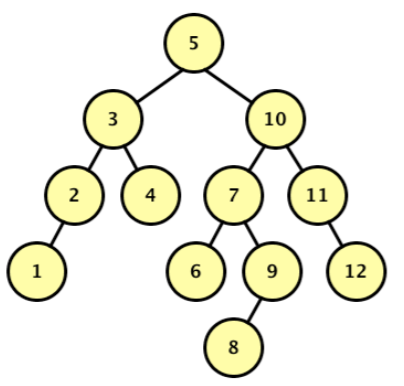

(a) Draw the resulting BST after 5 is removed, but before any rebalancing takes place. Label each node in the resulting tree with its balance factor. Replace a node with both children using an appropriate value from the node's left child.

(b) Now rebalance the tree that results from (a). Draw a new tree for each rotation that occurs when rebalancing the AVL Tree (you only need to draw one tree that results from an RL or LR rotation). You do not need to label these trees with balance factors.

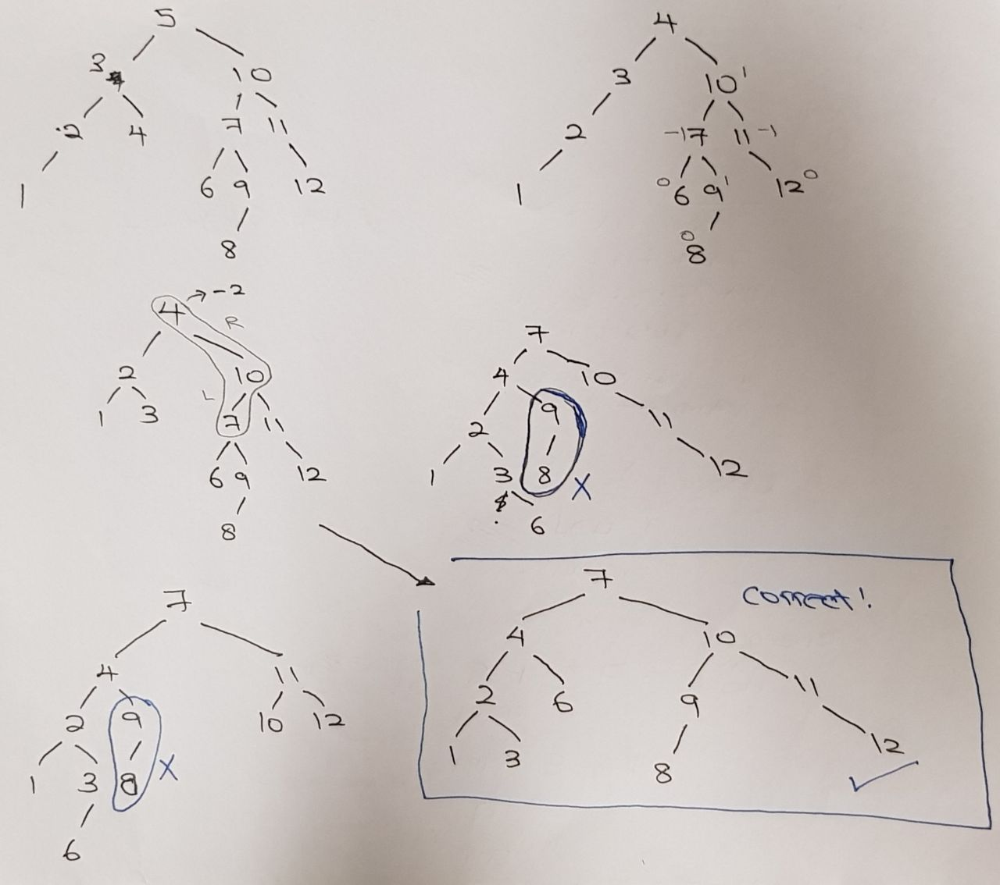

**SOLUTION FOR (a) CLICK HERE**


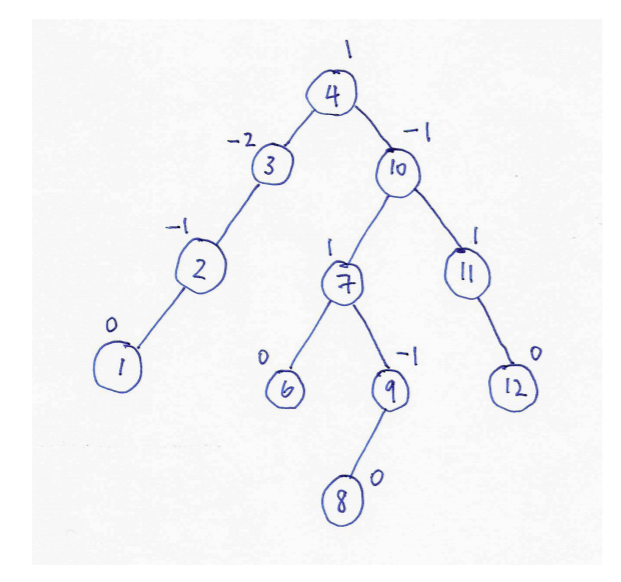


**SOLUTION FOR (b) CLICK HERE**


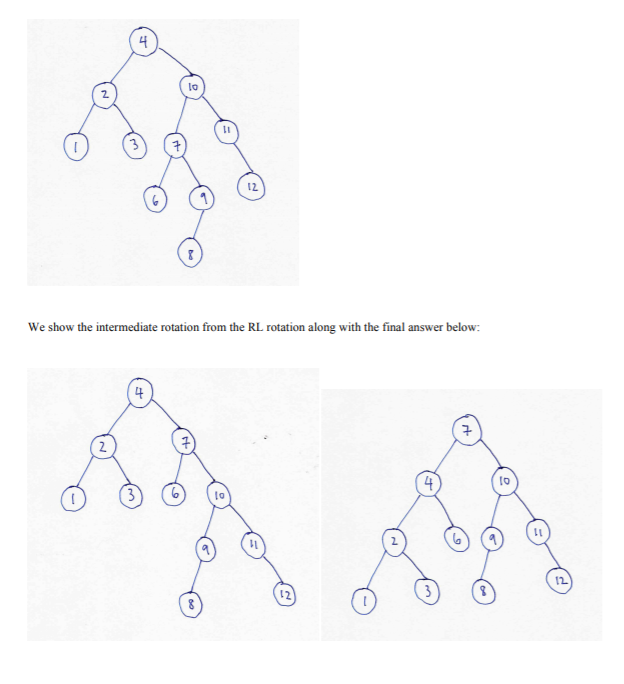


# CHECK THIS VIDEO BELOW TO LEARN HOW TO INSERT INTO AN AVL TREE!

## The trick here is to LOOK AT THE MEDIAN NODE of the tree (consider only 3 nodes) to rebalance, i.e. the larger than median node will be on the median node's right and the lesser than median node will be on its left. Whatever is attached to the right remains attached to the right, whatever is attached to the left remains attached to the left.

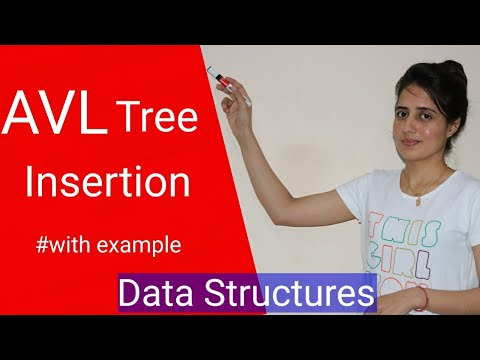

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo('_8qqlVH5NC0', width = 800, height = 500)

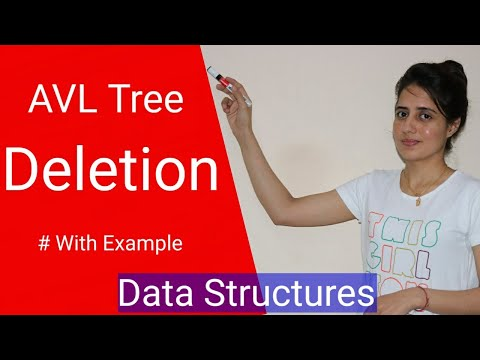

In [2]:
from IPython.display import YouTubeVideo
YouTubeVideo('LXdi_4kSd1o', width = 800, height = 500)

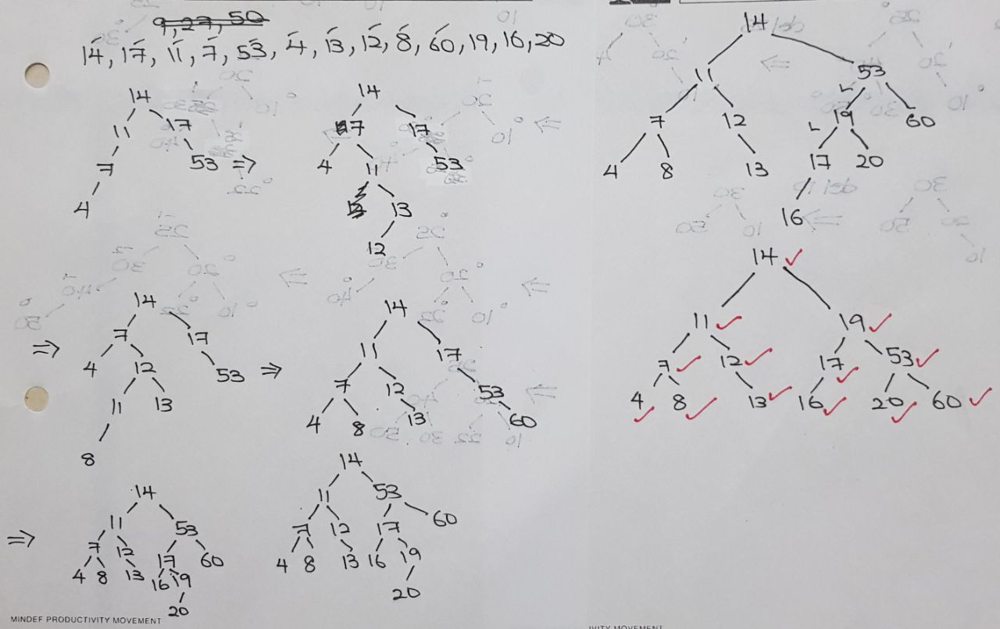

### Extra Question 2
Insert 9, 27, 50, 15, 2, 21, 36
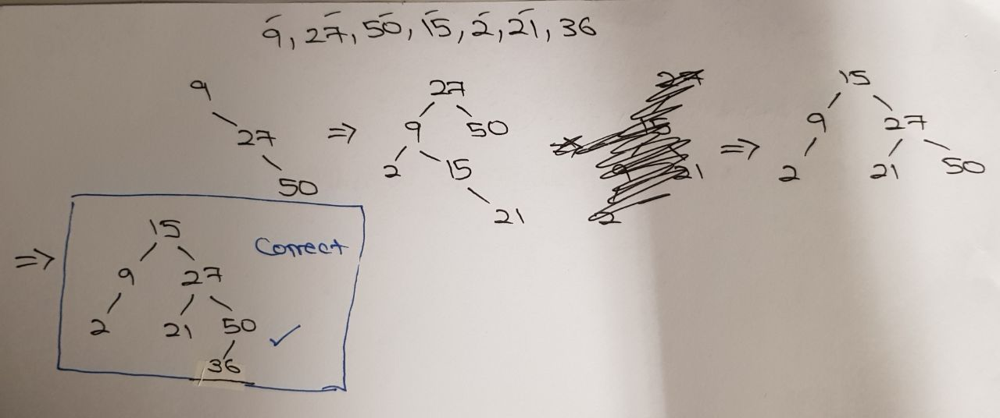


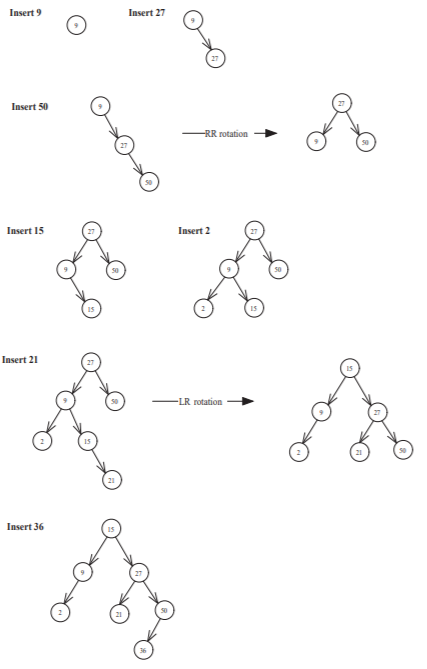